# Landscape of open chromatin in cancers via ATAC-seq (TCGA)

First, load file metadata and dependencies. Note that rows in the metadata are already aligned to be from the same observation.

In [1]:
import sys
sys.path.append("./")
from settings import settings, paths
import pandas as pd
import muffin
import numpy as np
import scanpy as sc
import os
sequencing_metadata = pd.read_csv(paths.atac_cancer_meta, 
                                  sep="\t", index_col=0)
# Avoids warning spam
os.environ['PYTHONWARNINGS']='ignore'



You can set plot settings for muffin :

In [2]:
muffin.params["autosave_plots"] = "atac_tcga_results/"
muffin.params["figure_dpi"] = 300
muffin.params["autosave_format"] = ".pdf"
sc.set_figure_params(dpi=300, dpi_save=300)
sc.set_figure_params(dpi=300, dpi_save=300)
sc.settings.autosave = True
sc.settings.figdir = "atac_tcga_results/"
# Makes pdf font editable with pdf editors
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

We can load the dataset using pandas and the helper functions, then add additionnal metadata :

In [3]:
dataset_tsv = pd.read_csv(paths.atac_cancer_table, sep="\t")
dataset = muffin.load.dataset_from_arrays(dataset_tsv.iloc[:, 7:].values.T, row_names=dataset_tsv.columns[7:],
                                          col_names=dataset_tsv["name"])
dataset.var = dataset_tsv.iloc[:, :7]
dataset.obs["Cancer type"] = [s[:4] for s in dataset.obs_names]
dataset.obs["FRIP"] = sequencing_metadata["FRIP"].values
dataset.obs["Subtype"] = sequencing_metadata["BRCA_pam50"].values
dataset.obs["Subtype"][dataset.obs["Subtype"]=="Normal"] = np.nan
dataset.var.rename(columns={"seqnames":"Chromosome","start":"Start","end":"End"}, inplace=True)

The dataset is in an anndata object, which allows for an easy annotation of the count matrix, and the storage of different count transforms. Results will be stored in this object.

In [4]:
print(dataset)

AnnData object with n_obs × n_vars = 796 × 562709
    obs: 'Cancer type', 'FRIP', 'Subtype'
    var: 'Chromosome', 'Start', 'End', 'name', 'score', 'annotation', 'GC'


Here, we can re-name our features (columns of the count matrix) to the nearest gene's name for convenience in downstream analyses. The dataset variable annotation has been automatically annotated with genomic locations in the previous step. Note that the gsea_obj object also provides functions for gene set enrichment of nearby genes.

In [5]:
gsea_obj = muffin.grea.pyGREAT(paths.GOfile, paths.gencode, paths.chromsizes)
dataset.var_names = gsea_obj.label_by_nearest_gene(dataset.var[["Chromosome","Start","End"]]).astype(str)

Here, we set up the design matrix of the linear model. If you do not want to regress any confounding factors leave it to a column array of ones as in the example. Note that it can have a tendency to "over-regress" and remove biological signal as it is a simple linear correction.

In [6]:
design = np.ones((dataset.X.shape[0],1))
muffin.load.set_design_matrix(dataset, design)

Now, we are going to normalize library sizes using the scran approach, which is well suited to a large number of observations and small counts with many zeroes. We are also going to remove features with very low signal (note that this is mandatory to remove all zero counts).

In [7]:
muffin.tools.compute_size_factors(dataset, method="deseq")
detectable = muffin.tools.trim_low_counts(dataset)
dataset = dataset[:, detectable]

The next step is to fit the mean-variance relationship and compute residuals to the fitted Negative Binomial model.

[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done 248 tasks      | elapsed:   12.3s
[Parallel(n_jobs=16)]: Done 2000 out of 2000 | elapsed:   15.2s finished
[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done 9248 tasks      | elapsed:   26.3s
[Parallel(n_jobs=16)]: Done 86048 tasks      | elapsed:  1.6min
[Parallel(n_jobs=16)]: Done 214048 tasks      | elapsed:  3.5min
[Parallel(n_jobs=16)]: Done 393248 tasks      | elapsed:  6.2min
[Parallel(n_jobs=16)]: Done 561638 tasks      | elapsed:  8.8min
[Parallel(n_jobs=16)]: Done 562709 out of 562709 | elapsed:  8.8min finished


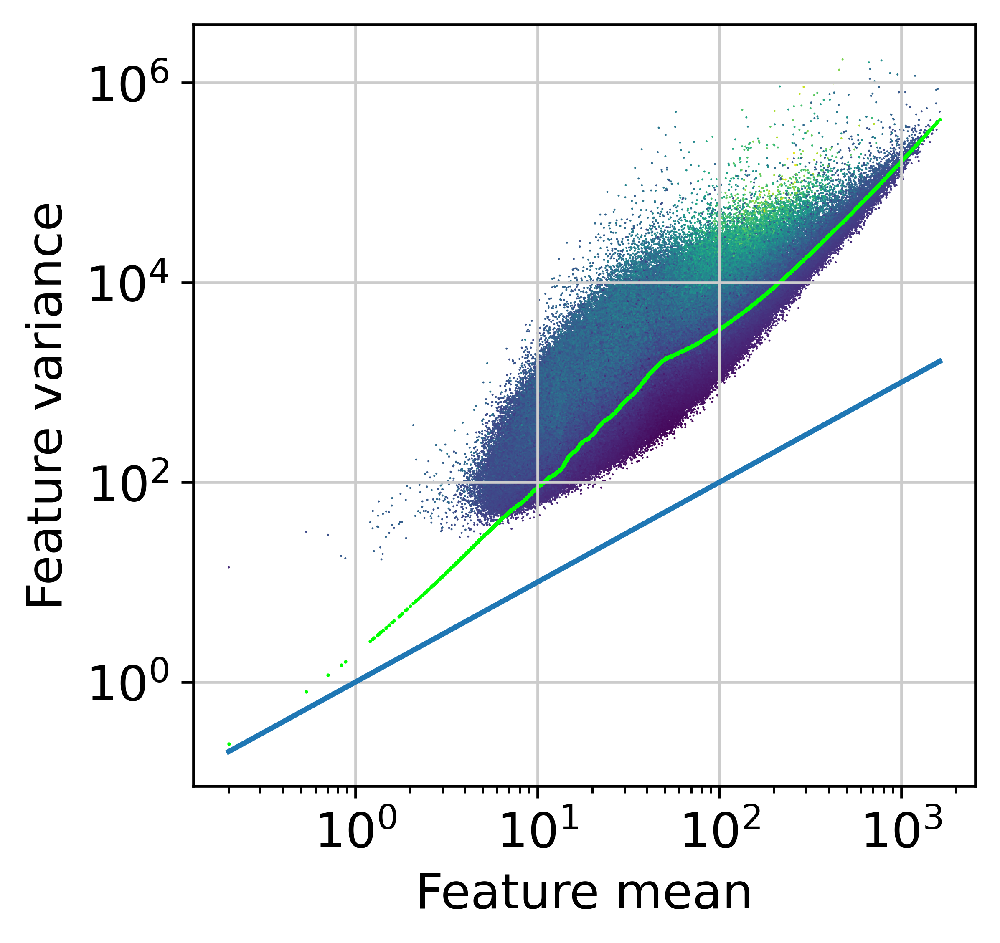

AnnData object with n_obs × n_vars = 796 × 562709
    obs: 'Cancer type', 'FRIP', 'Subtype', 'size_factors'
    var: 'Chromosome', 'Start', 'End', 'name', 'score', 'annotation', 'GC', 'means', 'variances', 'reg_alpha'
    obsm: 'design'
    layers: 'residuals'

In [8]:
muffin.tools.compute_residuals(dataset, maxThreads=16)

We can perform feature selection to remove peaks with low information.

<Figure size 1200x1200 with 0 Axes>

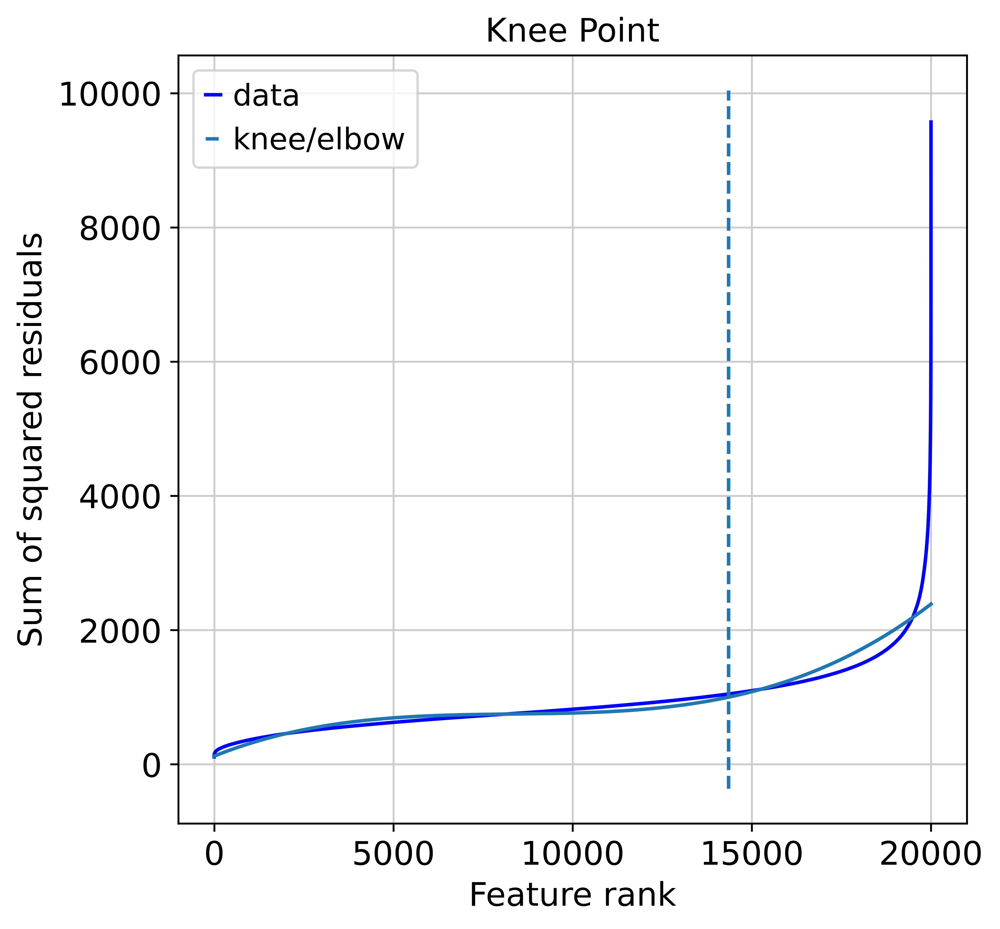

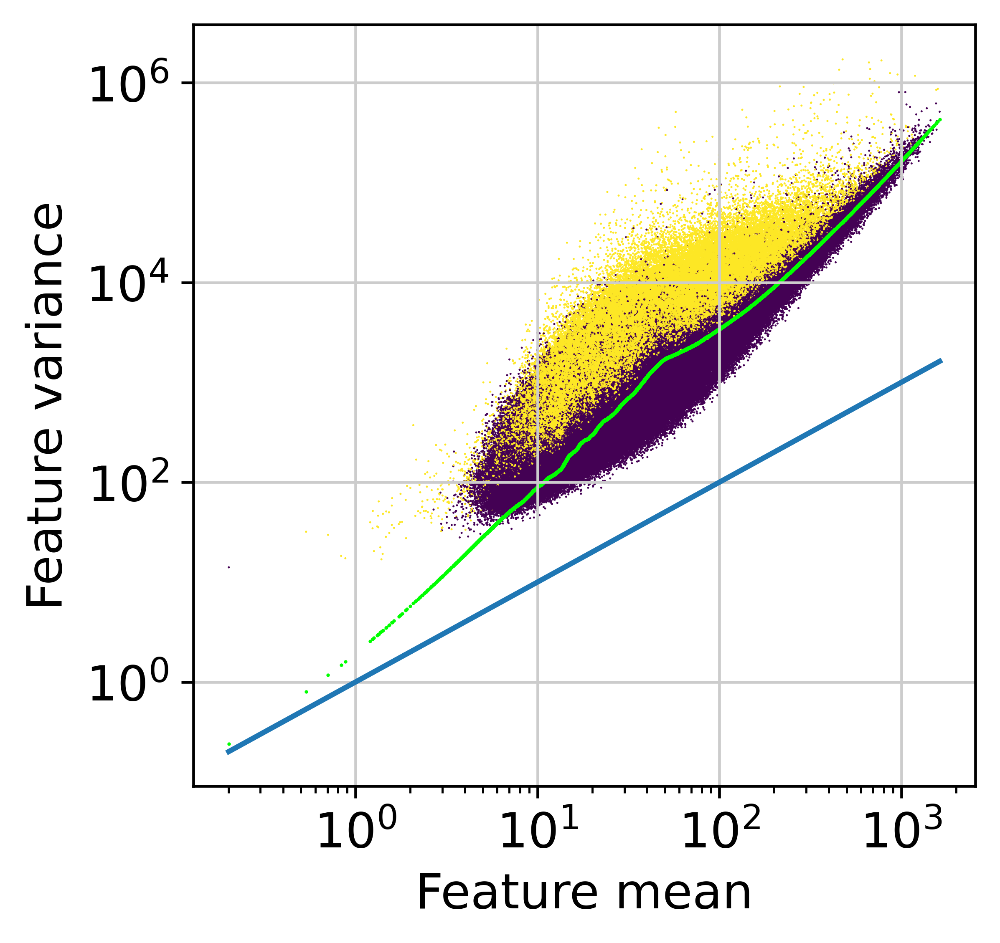

In [9]:
hv = muffin.tools.feature_selection_elbow(dataset)

Next, we perform dimensionnality reduction with PCA (automatically finding the optimal dimensionnality) and UMAP.

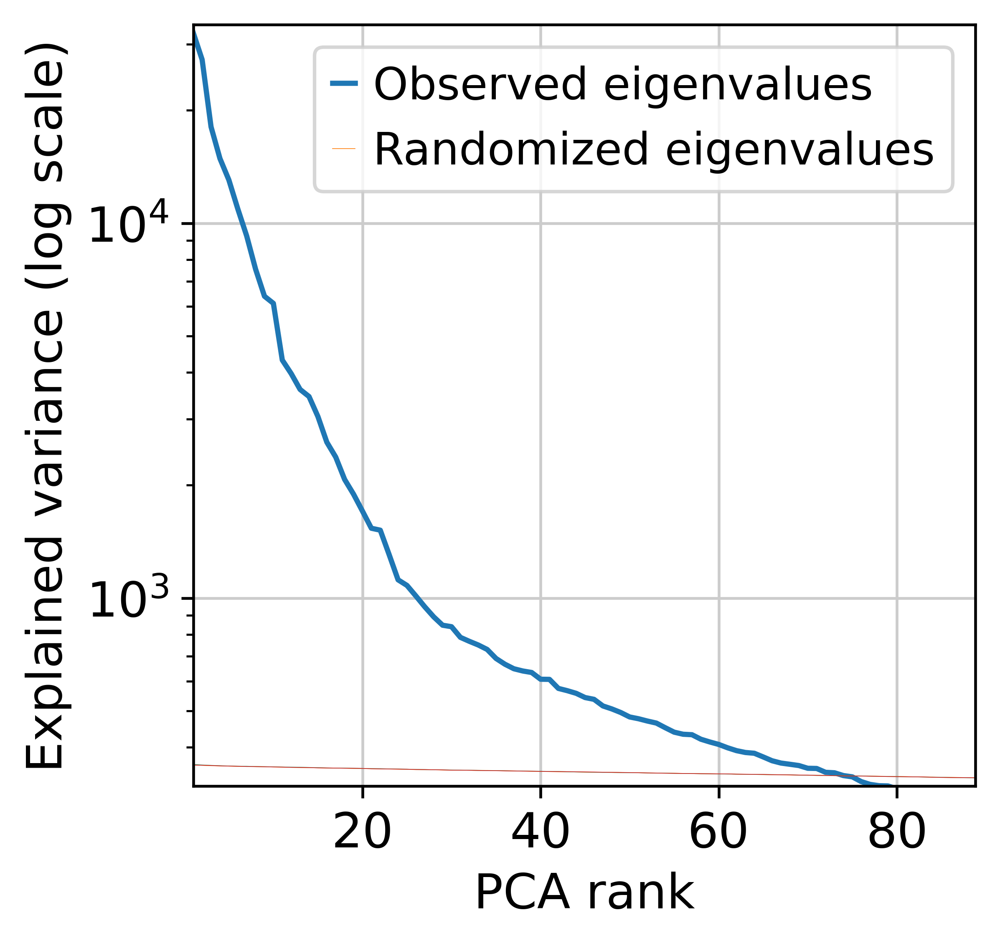

AnnData object with n_obs × n_vars = 796 × 562709
    obs: 'Cancer type', 'FRIP', 'Subtype', 'size_factors'
    var: 'Chromosome', 'Start', 'End', 'name', 'score', 'annotation', 'GC', 'means', 'variances', 'reg_alpha'
    uns: 'pca'
    obsm: 'design', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'residuals'

In [10]:
muffin.tools.compute_pa_pca(dataset, feature_mask=hv, max_rank=100, plot=True)
# Reduce spacing between points a bit to improve readability
muffin.tools.compute_umap(dataset, umap_params={"min_dist":0.5, "n_neighbors":30})

Display the results. Note that we can use scanpy functions here!

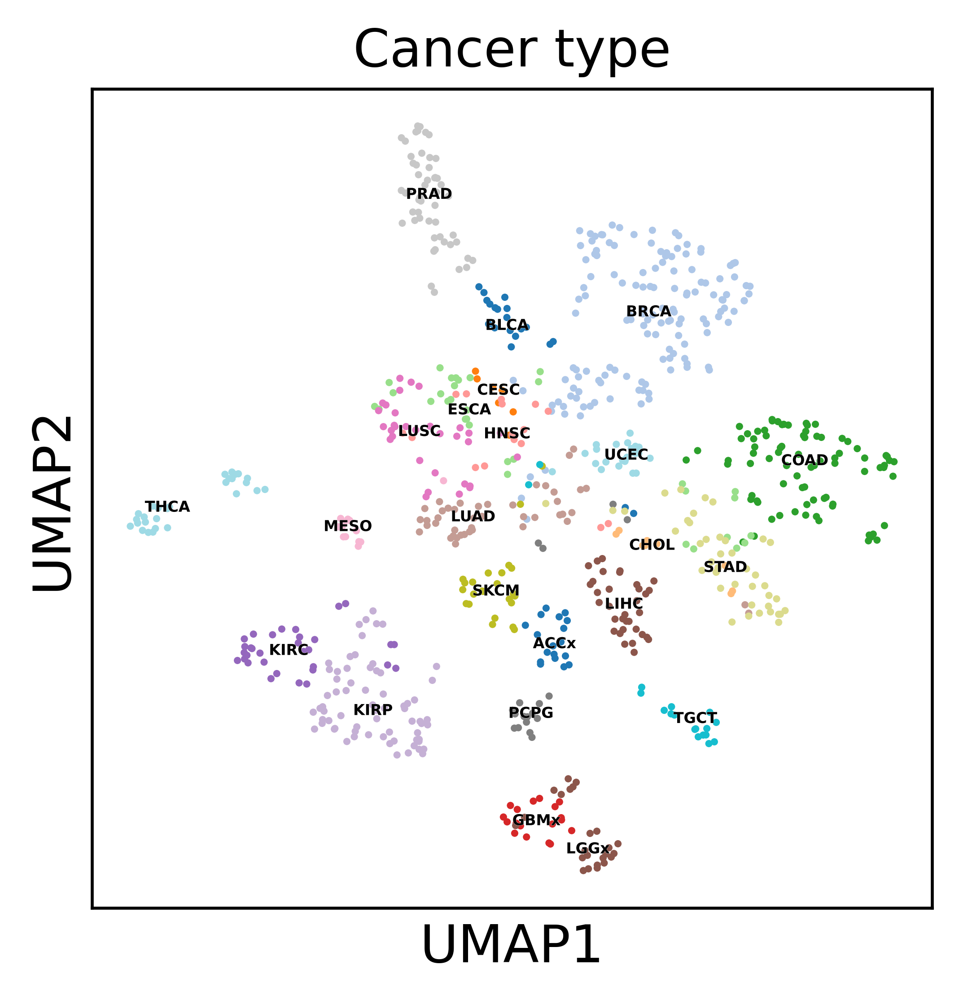

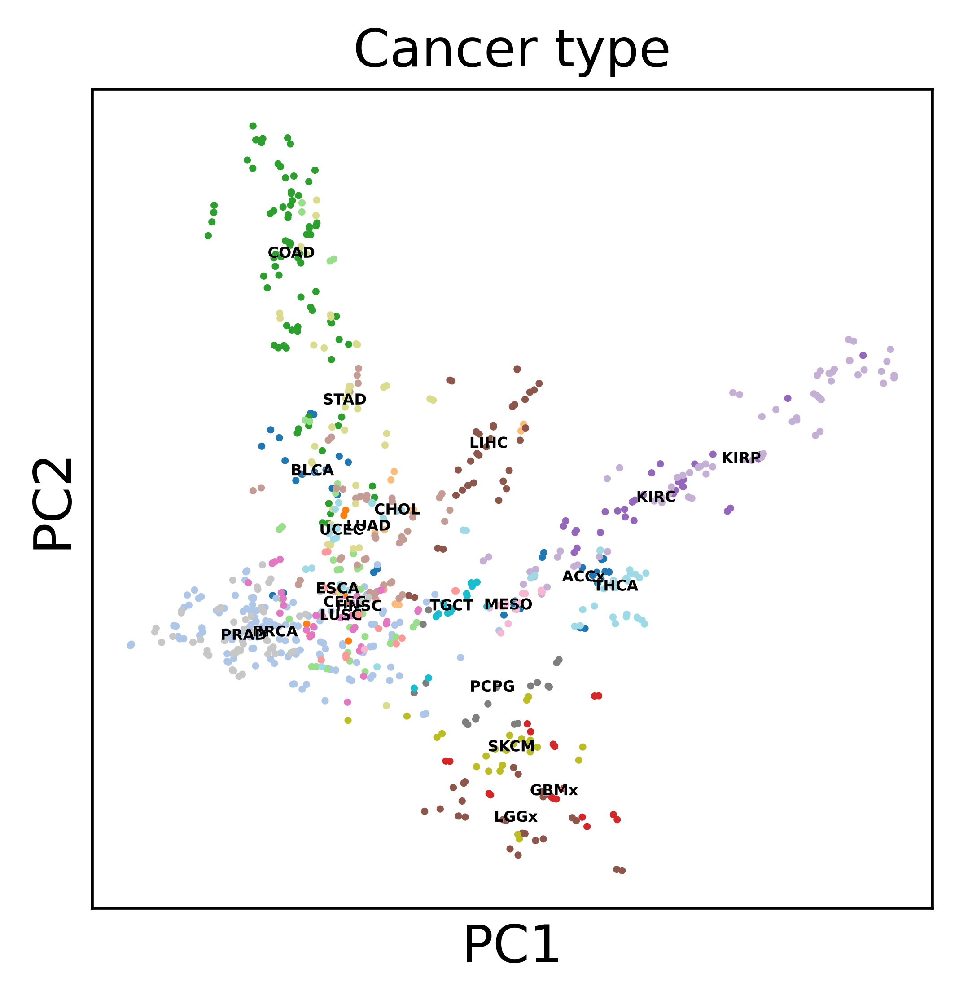

In [11]:
# Append cell type info to the dataset
sc.pl.umap(dataset, color='Cancer type', legend_loc='on data',
                legend_fontsize=4, legend_fontoutline=0.1, s=15.0,
                palette='tab20', save=f"umap_all_tcga.pdf")
sc.pl.pca(dataset, color='Cancer type', legend_loc='on data',
                legend_fontsize=4, legend_fontoutline=0.1, s=15.0,
                palette='tab20')

We can also use heatmaps, even if we have a large number of observations and features :

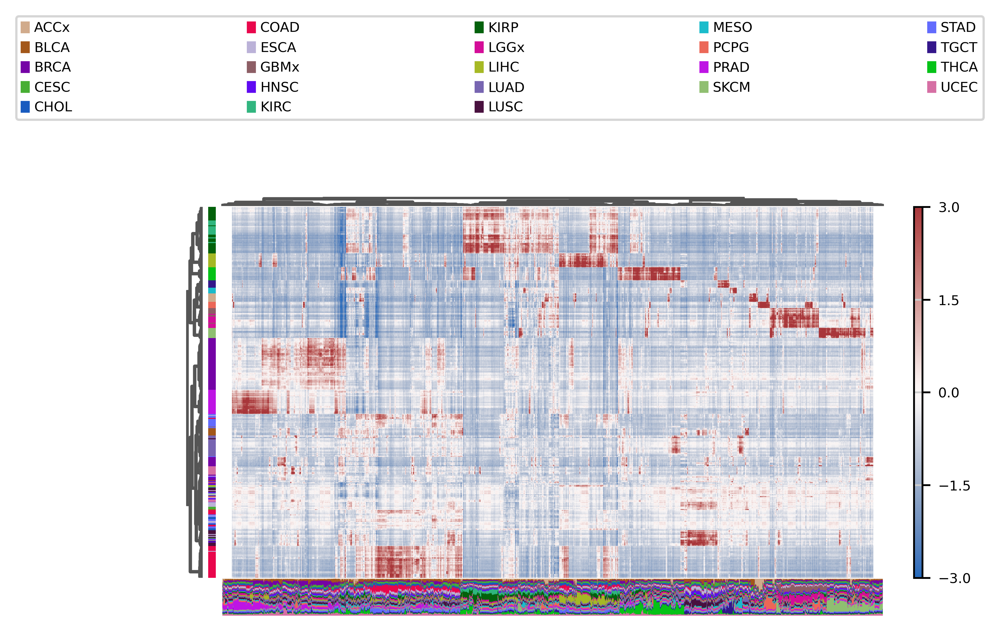

In [12]:
fig, ax = muffin.plots.mega_heatmap(dataset[:, hv], label_col="Cancer type", layer="residuals", vmin=-3, vmax=3)

Let's focus on Breast cancer subtypes:

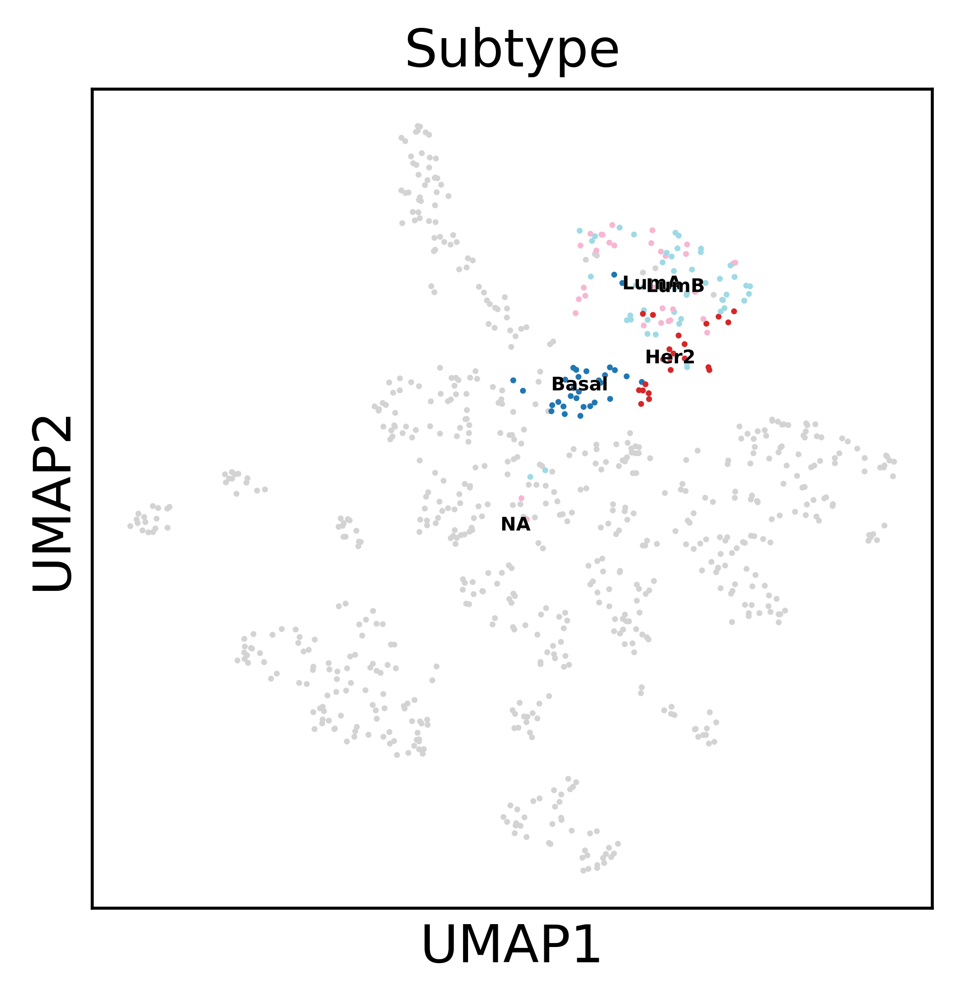

In [13]:
sc.pl.umap(dataset, color='Subtype', legend_loc='on data',
            legend_fontsize=5, legend_fontoutline=0.1, s=10.0, 
            palette='tab20')

In [14]:
# Only BRCA subtype info is specified
brca_subset = dataset[~dataset.obs["Subtype"].isna()]

Find specific markers for each subtype using logistic regression coefficients.

In [15]:
from sklearn.preprocessing import StandardScaler
brca_subset.layers["scaled"] = StandardScaler().fit_transform(brca_subset.layers["residuals"])
sc.tl.rank_genes_groups(brca_subset, 'Subtype', use_raw=False, layer="scaled",
                        method='logreg', class_weight="balanced")

We can see some known markers (ERBB2 is the main marker of Her2+ breast cancer, MAP3K3 is a part of the MAPK kinase and known to be over-expressed in Luminal cancers).

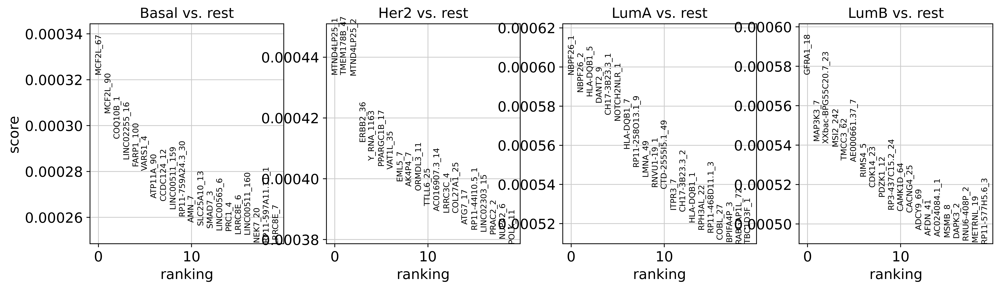

In [16]:
sc.pl.rank_genes_groups(brca_subset, sharey=False)

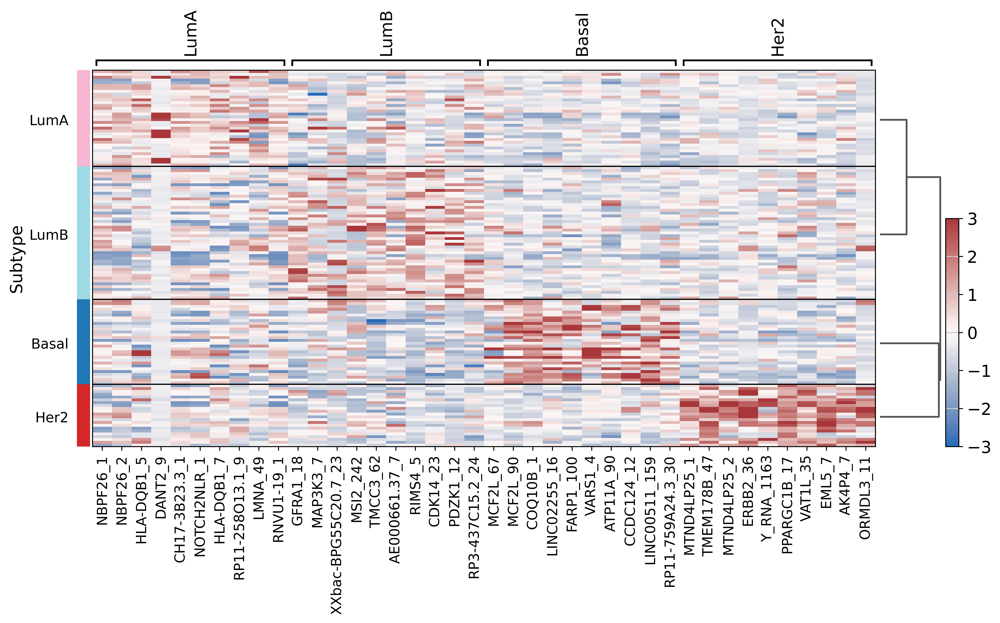

In [17]:
# Ugly hack to solve an issue with scanpy logreg that does not output all fields
brca_subset.uns["rank_genes_groups"]["logfoldchanges"] = brca_subset.uns["rank_genes_groups"]["scores"]
brca_subset.uns["rank_genes_groups"]["pvals"] = brca_subset.uns["rank_genes_groups"]["scores"]
brca_subset.uns["rank_genes_groups"]["pvals_adj"] = brca_subset.uns["rank_genes_groups"]["scores"]
sc.pl.rank_genes_groups_heatmap(brca_subset, layer="scaled", use_raw=False, vmin=-3, vmax=3, cmap="vlag")

We can save our work to avoid recomputing everything. It can easily be re-loaded using :  anndata.read_h5ad(path). We can also see that our dataset carries much more data than at the start.

In [18]:
dataset.write("atac_tcga_results/dataset.h5ad")
print(dataset)

AnnData object with n_obs × n_vars = 796 × 562709
    obs: 'Cancer type', 'FRIP', 'Subtype', 'size_factors'
    var: 'Chromosome', 'Start', 'End', 'name', 'score', 'annotation', 'GC', 'means', 'variances', 'reg_alpha'
    uns: 'pca', 'Cancer type_colors', 'Subtype_colors'
    obsm: 'design', 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'residuals'


Let's find if our cancer subtypes markers are located near genes involved in cancer hallmarks.

In [22]:
enricher_hallmarks = muffin.grea.pyGREAT(paths.cancerHallmarks,
                                        paths.gencode, paths.chromsizes)

In [23]:
import seaborn as sns
subtypes = np.sort(np.unique(brca_subset.obs["Subtype"].values))
enrich_per_subtype = dict()
for s in subtypes:
    print(s)
    bg = brca_subset.var[["Chromosome", "Start", "End"]]
    # Take the top 5% markers. 
    # Unfortunately due to the number of features the p-value computation is untractable for the logistic regression
    query = brca_subset.var.loc[brca_subset.uns["rank_genes_groups"]["names"][s][:int(brca_subset.shape[1]*0.05+1)]][["Chromosome", "Start", "End"]]
    enrich_per_subtype[s] = enricher_hallmarks.find_enriched(query, bg, cores=16, maxGenes=1e9)

Basal


[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  10 out of  10 | elapsed:   13.6s finished


Her2


[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  10 out of  10 | elapsed:   13.6s finished


LumA


[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  10 out of  10 | elapsed:   13.7s finished


LumB


[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done  10 out of  10 | elapsed:   13.9s finished


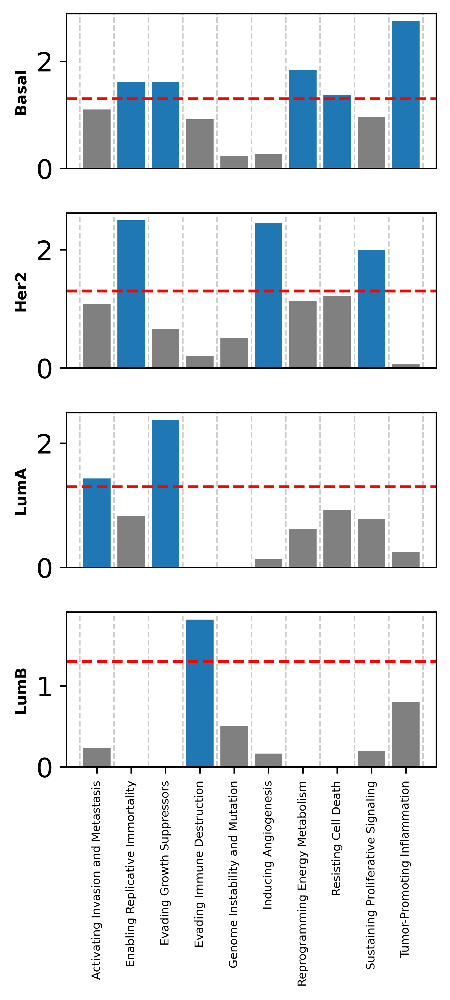

In [24]:
import matplotlib.pyplot as plt
series_dict = dict([(s, enrich_per_subtype[s]["P(Beta > 0)"]) for s in enrich_per_subtype.keys()])
# Create the complete index list
index_list = []
for analysis in series_dict.values():
    index_list.extend(analysis.index.tolist())
index_list = list(set(index_list))

# Update each series to have the complete index
for name, analysis in series_dict.items():
    for index in index_list:
        if index not in analysis:
            series_dict[name][index] = 1

# Create subplots
fig, axs = plt.subplots(len(series_dict), 1, sharex=True, figsize=(3.5, 7.5))

# Plot each analysis
for i, (ax, (name, analysis)) in enumerate(zip(axs, series_dict.items())):
    analysis = (-np.log10(analysis)).sort_index()
    bar_colors = [(0.12156862745098039, 0.4666666666666667, 0.7058823529411765) if p > -np.log10(0.05) else (0.5,0.5,0.5) for p in analysis.values]
    ax.bar(analysis.index, analysis.values, color=bar_colors, width=0.8)
    ax.set_xlim(ax.get_xlim()[0], ax.get_xlim()[1])
    ax.hlines(-np.log10(0.05), ax.get_xlim()[0], ax.get_xlim()[1], color="red", linestyle="dashed")
    # ax.set_title(name, fontweight="heavy")
    ax.set_ylabel(name, fontweight="heavy", fontsize=8)
    ax.tick_params(which='minor', bottom=False)
    if i != len(series_dict) - 1:  # if not the last subplot
        ax.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
    else:  # if the last subplot
        ax.tick_params(axis='x', rotation=90, labelsize=6)
    ax.set_xticks(np.arange(-0.5, len(analysis.index) + 0.5, 1), minor=True)  # set x ticks for minor grid
    ax.grid(False)
    ax.grid(which='minor', axis='x', linestyle="dashed")

plt.tight_layout()
plt.savefig("atac_tcga_results/hallmark_enrich.pdf", bbox_inches="tight")
plt.show()

In [25]:
enricher_hallmarks.mat

,ABL1,ABL2,ACP1,ACTB,ACTG1,ACTN1,ACTN2,ACTN3,ACTN4,ACVR1,...,bP-2168N6.3,bP-2171C21.2,bP-2171C21.3,bP-2171C21.5,bP-2189O9.2,bP-2189O9.5,hsa-mir-1253,hsa-mir-423,snoZ196,yR211F11.2
Activating Invasion and Metastasis,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
Enabling Replicative Immortality,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
Evading Growth Suppressors,1,1,0,1,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
Evading Immune Destruction,0,0,0,1,1,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
Genome Instability and Mutation,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Inducing Angiogenesis,0,0,0,1,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
Reprogramming Energy Metabolism,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Resisting Cell Death,1,1,0,1,1,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
Sustaining Proliferative Signaling,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
Tumor-Promoting Inflammation,0,0,0,1,1,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0


Experiment with PCA component selection:

In [26]:
from sklearn.decomposition import PCA
# Compute all PCs
x_pca = PCA(len(dataset)-1, whiten=True).fit_transform(dataset.layers["residuals"][:, hv])

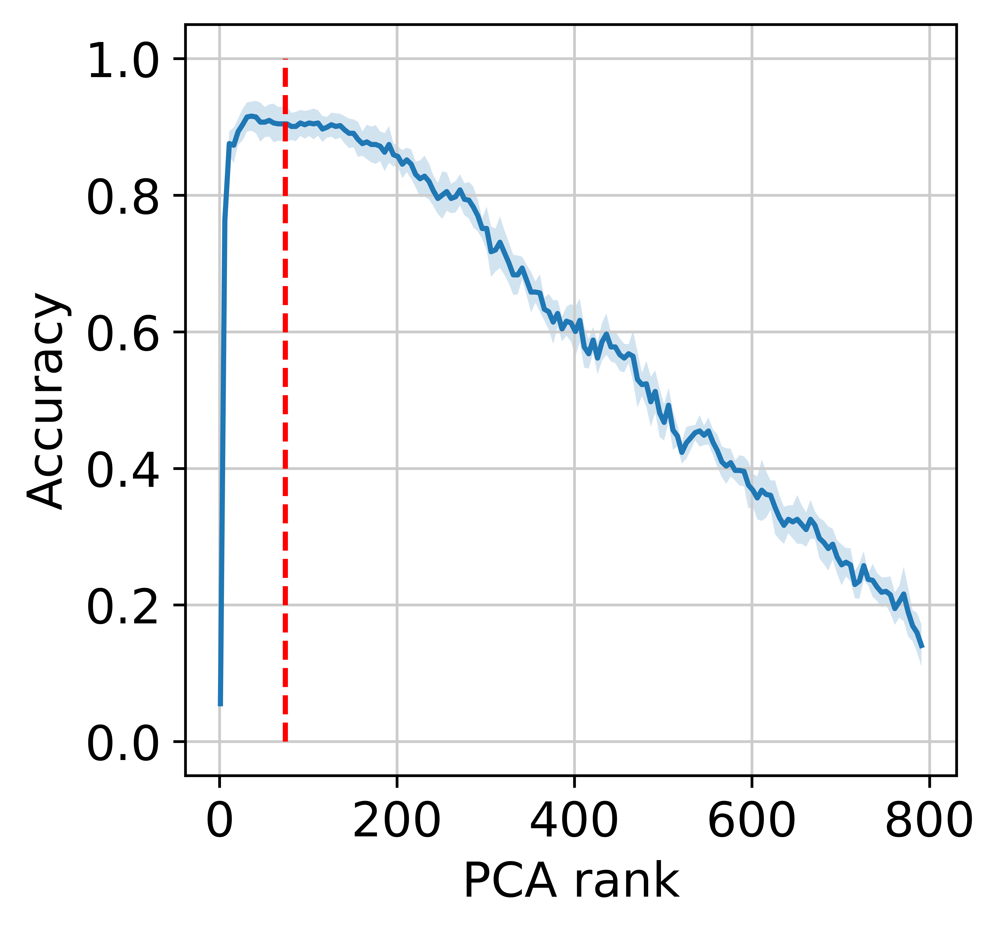

In [27]:
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
from scipy.stats import sem
optimalPC = dataset.obsm["X_pca"]
y = pd.factorize(dataset.obs["Cancer type"])[0]
accuracies = []
errors = []
for i in range(1, x_pca.shape[1], 5):
    knn = KNeighborsClassifier(metric="correlation")
    scores = cross_val_score(knn, x_pca[:, :i], y, cv=StratifiedKFold(7, shuffle=True, random_state=0))
    mean_accuracy = scores.mean()
    errors.append(sem(scores))
    accuracies.append((i, mean_accuracy))
accuracies = np.array(accuracies)
errors = np.array(errors)
plt.figure(dpi=500)
plt.plot(accuracies[:, 0], accuracies[:, 1])
plt.fill_between(accuracies[:, 0], accuracies[:, 1] - errors*1.96, accuracies[:, 1] + errors*1.96, alpha=0.2)
plt.vlines(optimalPC.shape[1], ymin=0.0, ymax=1.0, linestyles="dashed", color="r")
plt.ylabel("Accuracy")
plt.xlabel("PCA rank")
plt.savefig("atac_tcga_results/pca_knn.pdf")